# ELEC4542 Introduction to deep learning for computer vision [Section 1A, 2023] Project

Name: Hong Yuk Sing

Topic: Image Classification


## Part 3: Visualize the class activation maps of the trained models

Class Activation Maps (CAM) is a technique  used to visualize the regions of an image that contribute the most to the prediction made by a convolutional neural network for a specific class. It let us understand which parts of the image the network are more rely on when undergo decision making process. 

In this part, we have employed Class Activation Mapping (CAM) and its enhanced version, Grad-CAM++ to conduct a comprehensive analysis of a ResNet-18 model trained for a specific image classification task. The primary objective of this analysis was to generate a visual representation of the regions within the image data that were crucial for the model's prediction.


In this model,torch and torchvision are used to load the dataset and network.

In [215]:
import torch
import torchvision
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.models as models
import torch.optim as optim
from torch.optim import lr_scheduler

import matplotlib.pyplot as plt
import numpy as np

### 3.1. Model

The following model is copied from part 2, please refer to section 3.2 for the Class Activation Map.

In [216]:
train_transform = transforms.Compose(
    [
    transforms.RandomHorizontalFlip(),                                      # random horizontal flip
    transforms.RandomRotation((-7,7)),                                      # random rotation
    transforms.RandomAffine(0, shear=10, scale=(0.8,1.2)),                  # random crop, center crop
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),   # color jitter
    transforms.ToTensor(),                                                  
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))                  #normalize
    ]
)

trainset = datasets.CIFAR10(root="data", train=True, download=True, transform=train_transform)

trainloader = DataLoader(
    trainset, batch_size=4, shuffle=True, num_workers=2)

test_transform = transforms.Compose(
    [
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) 
    ]
)

testset = torchvision.datasets.CIFAR10(
    root="./data", train=False, download=True, transform=test_transform)

testloader = DataLoader(
    testset, batch_size=4, shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat', 'deer',
           'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


Define the ResNet-18 model

In [217]:
# modify the last layer to have 10 output layers (which to map to the 10 classess of the dataset)
resnet18 = models.resnet18(pretrained=True)
resnet18.fc = torch.nn.Linear(in_features=512, out_features=10)

if (torch.cuda.is_available()):
    device = "cuda"
elif (torch.backends.mps.is_available()) :
    device="mps"
else:
    device = "cpu"
print(device)
resnet18.to(device)


cuda


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Loss and Optimizer

The model loss and optimizer will be defined as follows

In [218]:
# define the loss function and optimizer
criterion = torch.nn.CrossEntropyLoss()
# optimizer = optim.SGD(resnet18.parameters(), lr=0.01, momentum=0.9)
# optimizer = optim.Adam(resnet18.parameters(), lr=0.01)
optimizer = torch.optim.AdamW(resnet18.parameters(), lr=1e-4, weight_decay=0.0001)

#
# Define a learning rate scheduler
# scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, patience=4, verbose=True)
# scheduler = lr_scheduler.StepLR(optimizer, step_size = 5, gamma=0.1, verbose=True)
# scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, 'min')
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, verbose=True, min_lr=1e-7, factor=0.5)


Train the network

In [219]:
num_epochs = 40

# these lists will store the values for each epoch
train_losses = []
validation_losses = []

# Training
for epoch in range(num_epochs):
    train_losses_epoch=[]
    val_losses_epoch=[]
    correct = 0
    total = 0
    for i, data in enumerate(trainloader, 0):
        resnet18.train()
        inputs, labels = data[0].to(device), data[1].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = resnet18(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        # record the current batch loss
        loss = criterion(outputs, labels)
        train_losses_epoch.append(loss.item())

        loss.backward()
        optimizer.step()

        if i % 200 == 199:  # print every 200 mini-batches
            print(f'epoch {epoch}  batch {i+1}/{len(trainloader)}  running loss {np.mean(train_losses_epoch):.3f}')
            train_losses_epoch = []

    train_losses.append(np.mean(train_losses_epoch))  # record the mean loss for this epoch

    # get the test accuracy after each epoch
    correct = 0
    total = 0
    with torch.no_grad():
        for data in testloader:
            images, labels = data[0].to(device), data[1].to(device)
            outputs = resnet18(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            val_loss = criterion(outputs, labels)
            val_losses_epoch.append(val_loss.item())
    
    validation_losses.append(np.mean(val_losses_epoch))  # record the mean validation loss for this epoch
    
    print('Accuracy of the network on the train images: %d %%' % (100 * correct / total))

    # step the scheduler
    scheduler.step(np.mean(train_losses_epoch))

epoch 0  batch 200/12500  running loss 2.303
epoch 0  batch 400/12500  running loss 2.147
epoch 0  batch 600/12500  running loss 2.053
epoch 0  batch 800/12500  running loss 2.020
epoch 0  batch 1000/12500  running loss 1.972
epoch 0  batch 1200/12500  running loss 2.008
epoch 0  batch 1400/12500  running loss 1.999
epoch 0  batch 1600/12500  running loss 2.006
epoch 0  batch 1800/12500  running loss 1.928
epoch 0  batch 2000/12500  running loss 1.890
epoch 0  batch 2200/12500  running loss 1.982
epoch 0  batch 2400/12500  running loss 1.988
epoch 0  batch 2600/12500  running loss 1.789
epoch 0  batch 2800/12500  running loss 1.898
epoch 0  batch 3000/12500  running loss 1.917
epoch 0  batch 3200/12500  running loss 1.910
epoch 0  batch 3400/12500  running loss 1.766
epoch 0  batch 3600/12500  running loss 1.767
epoch 0  batch 3800/12500  running loss 1.809
epoch 0  batch 4000/12500  running loss 1.878
epoch 0  batch 4200/12500  running loss 1.854
epoch 0  batch 4400/12500  running los

Evaluate the model result using the testing dataset

Accuracy of the network on the train images: 87 %
Accuracy of the network on the test images: 83 %


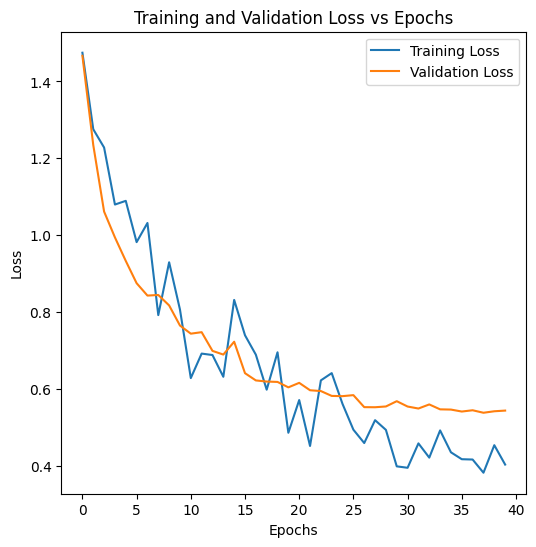

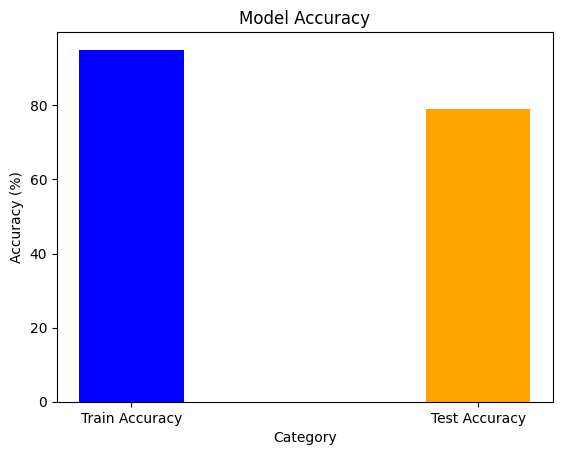

In [220]:
# Testing
correct = 0
total = 0

with torch.no_grad():
    for data in trainloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = resnet18(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the train images: %d %%' % (
    100 * correct / total))

correct = 0
total = 0

with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = resnet18(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %d %%' % (
    100 * correct / total))

# plot training and validation loss
plt.figure(figsize=(6, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(validation_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()

plt.show()

# Data
categories = ['Train Accuracy', 'Test Accuracy']
values = [95, 79]

# Create bar chart
plt.bar(categories, values, color=['blue', 'orange'],width=0.3)

# Add title and labels
plt.title('Model Accuracy')
plt.xlabel('Category')
plt.ylabel('Accuracy (%)')

# Show the plot
plt.show()

here are some samples from the network


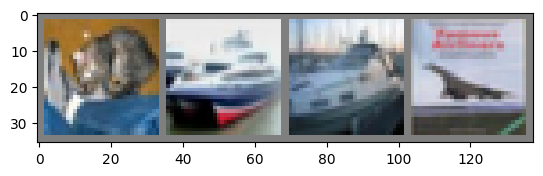

Predicted:    cat  ship   car plane
True:    cat  ship  ship plane


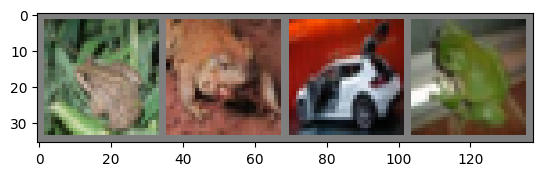

Predicted:   frog  frog   car  frog
True:   frog  frog   car  frog


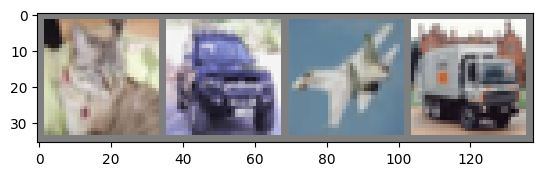

Predicted:    cat   car plane truck
True:    cat   car plane truck


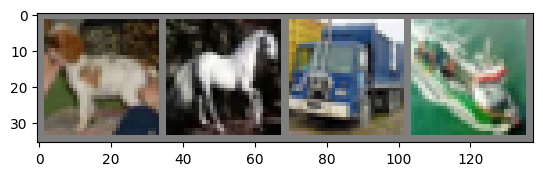

Predicted:    dog horse truck  ship
True:    dog horse truck  ship


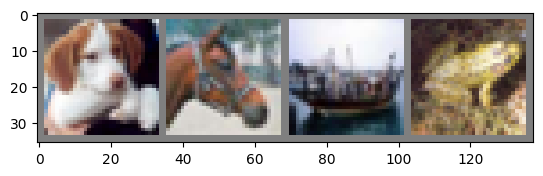

Predicted:    dog horse  ship  frog
True:    dog horse  ship  frog


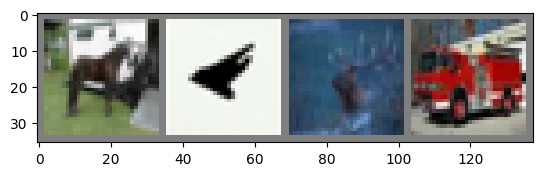

Predicted:  horse plane  deer truck
True:  horse plane  deer truck


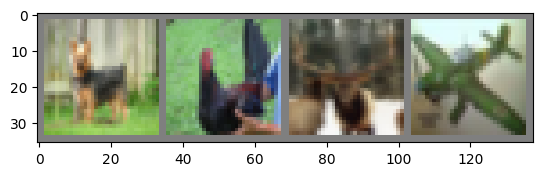

Predicted:   deer  bird  deer plane
True:    dog  bird  deer plane


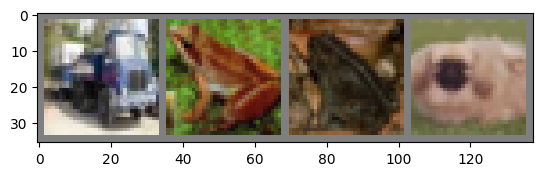

Predicted:  truck  frog  frog   dog
True:  truck  frog  frog   dog


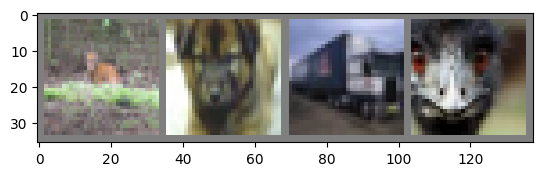

Predicted:   deer   dog truck   car
True:   deer   dog truck  bird


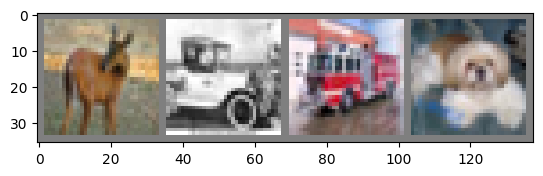

Predicted:   deer truck truck   dog
True:   deer   car truck   dog


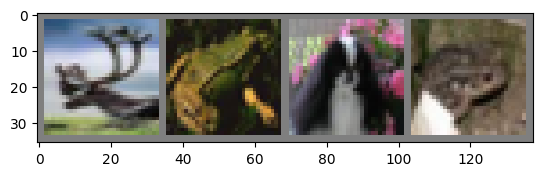

Predicted:   deer  frog   cat  frog
True:   deer  frog   dog  frog


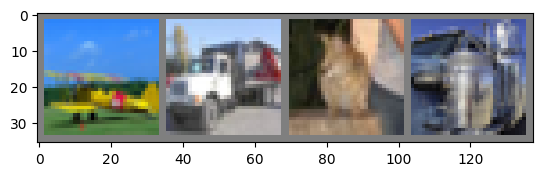

Predicted:  plane truck   cat truck
True:  plane truck   cat truck


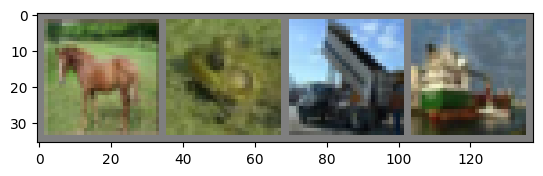

Predicted:  horse  frog truck  ship
True:  horse  frog truck  ship


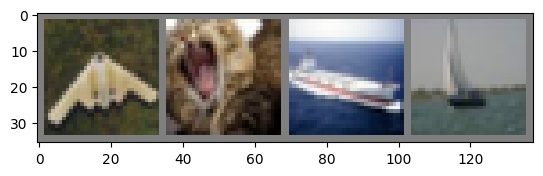

Predicted:   bird   dog  ship  ship
True:  plane   cat  ship  ship


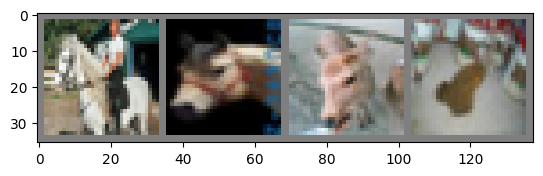

Predicted:  horse   cat   dog  bird
True:  horse horse  deer  frog


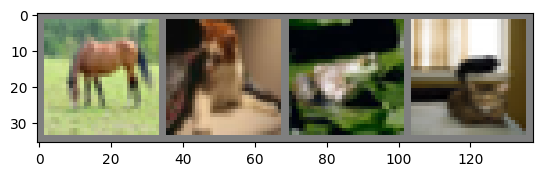

Predicted:  horse   dog  frog  bird
True:  horse   cat  frog   cat


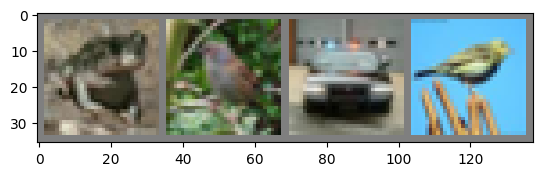

Predicted:   frog  bird   car  bird
True:   frog  bird   car  bird


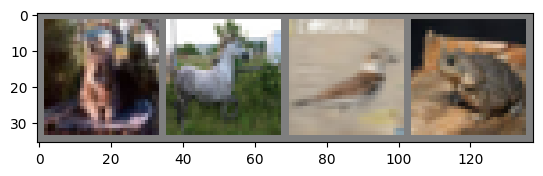

Predicted:    cat horse  bird  frog
True:    cat horse  bird  frog


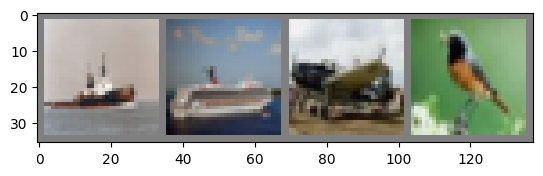

Predicted:   ship  ship plane  bird
True:   ship  ship plane  bird


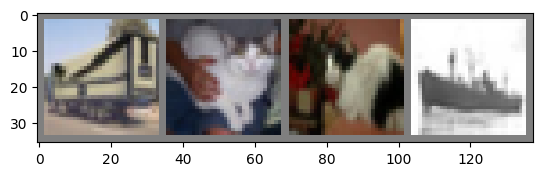

Predicted:  truck   cat   cat  ship
True:  truck   cat   cat  ship


In [221]:
import matplotlib.pyplot as plt
import numpy as np

# function to show an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# get some random test images
dataiter = iter(testloader)
num_of_images_to_be_printed = 20
counter = 0

print("here are some samples from the network")

for images, labels in testloader:
    if (counter == num_of_images_to_be_printed):
        break

    counter = counter + 1

    imshow(torchvision.utils.make_grid(images))
    outputs = resnet18(images.to(device))
    _, predicted = torch.max(outputs, 1)
    print('Predicted: ', ' '.join('%5s' % classes[predicted[j]] for j in range(4)))
    print('True: ', ' '.join('%5s' % classes[labels[j]] for j in range(4)))

### 3.2. Class Activation Map

We implemented both the CAM and Grad-CAM++ methodologies to each layer of the ResNet-18 model, namely layer1, layer2, layer3, and layer4. For each layer, we generated and presented a heatmap for a sample of 20 images from the test set. These heatmaps illuminated the regions with varying degrees of brightness, indicating the level of significance these regions held in the model's decision-making process. In the output section, for each image, the original version, CAM, and Grad-CAM for every layer are shown.

#### ***please refer to 3.3 for analysis and conclusion

In [ ]:
# install grad-cam module
!pip install grad-cam

In [223]:
import numpy as np
import cv2
import PIL


from pytorch_grad_cam import GradCAM,GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image,preprocess_image
     

In [224]:
import torch
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import cv2
import numpy as np

classes = ('plane', 'car', 'bird', 'cat', 'deer',
           'dog', 'frog', 'horse', 'ship', 'truck')


testset_CAM = torchvision.datasets.CIFAR10(
    root="./data", train=False, download=True)

# move the model to cpu
resnet18 = resnet18.cpu()

Files already downloaded and verified



The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


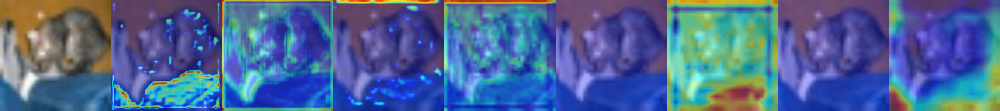


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


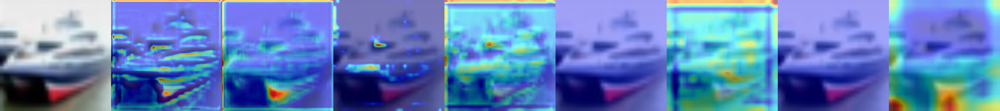


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


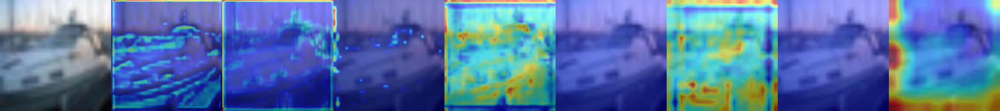


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


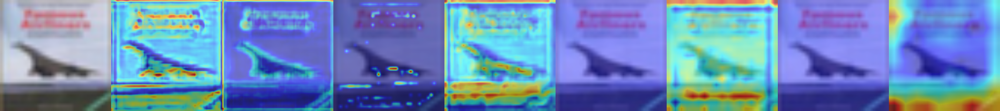


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


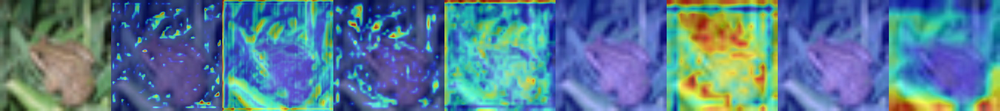


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


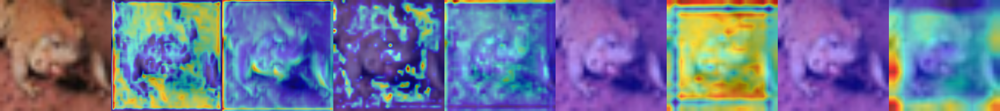


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


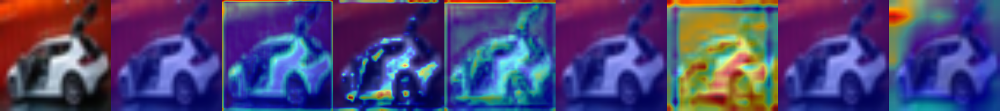


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


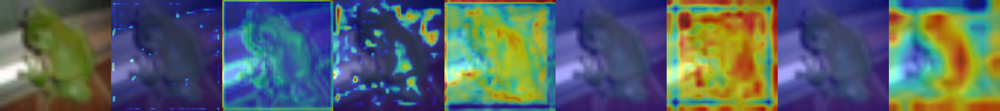


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


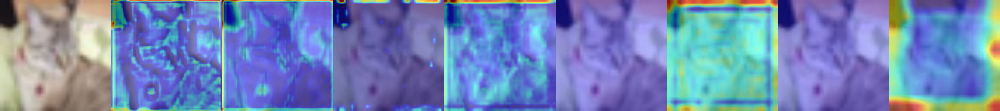


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


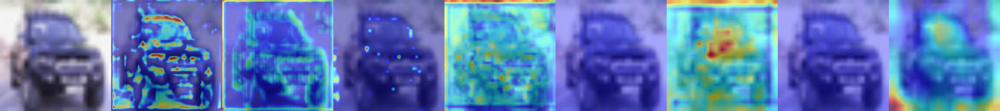


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


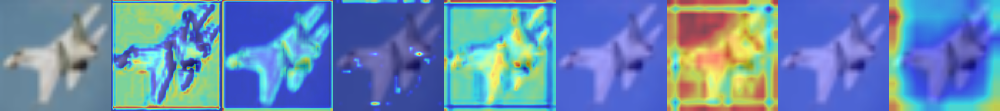


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


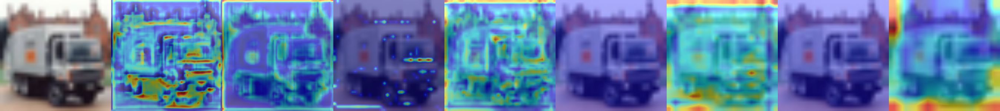


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


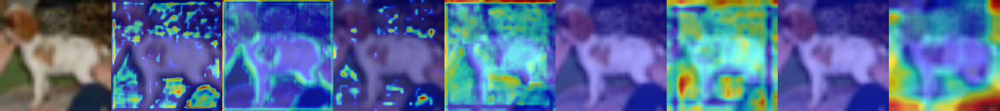


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


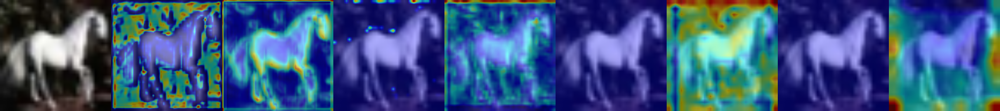


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


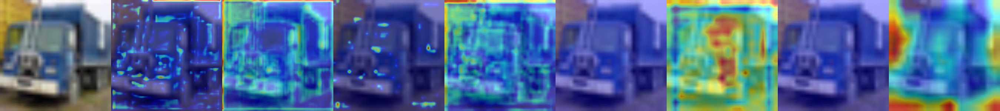


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


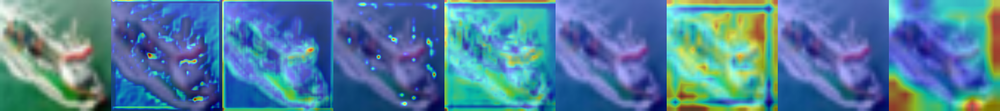


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


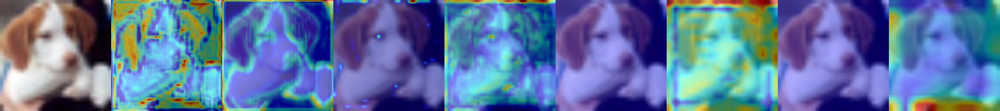


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


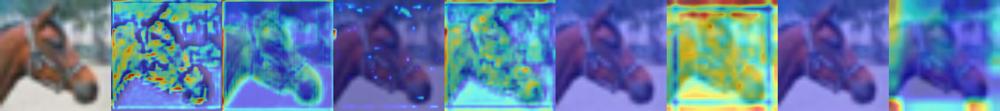


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


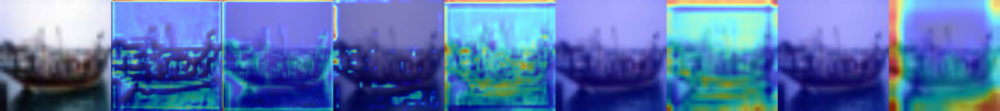


The original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4


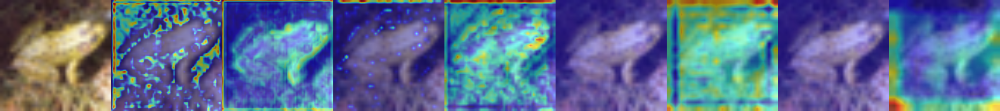

In [225]:
from IPython.display import display

# Define the target layers in resnet18 model
target_layers = [resnet18.layer1, resnet18.layer2, resnet18.layer3, resnet18.layer4]

# Get the first image
for i in range(20):
    image, labels = testset_CAM[i]

    # Convert the tensor to a numpy array
    numpy_image = np.array(image)
    img = cv2.resize(numpy_image, (300,300))
    img = img.astype('float32') / 255.0
    input_tensor = preprocess_image(img)

    print("\nThe original image --- CAM layer 1 --- Grad-CAM++ layer 1 --- CAM layer 2 --- Grad-CAM++ layer 2 --- CAM layer 3 --- Grad-CAM++ layer 3 --- CAM layer 4 --- Grad-CAM++ layer 4")
   
    # Initialize the image list with the original image
    images = [np.uint8(255*img)]

    for layer in target_layers:
        cam = GradCAM(model=resnet18, target_layers=[layer])
        cam2 = GradCAMPlusPlus(model=resnet18, target_layers=[layer]) # use this for Grad-CAM++

        # generate CAM
        grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
        cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
        images.append(cam_image)

        # generate Grad-CAM++
        grayscale_cams2 = cam2(input_tensor=input_tensor, targets=targets)
        cam2_image = show_cam_on_image(img, grayscale_cams2[0, :], use_rgb=True)
        images.append(cam2_image)

    # display all the images side by side
    combined_image = np.hstack(images)
    display(PIL.Image.fromarray(combined_image))

### 3.3. Analysis

Across different layers, it is observed that the last layer's (layer 4) CAM adheres most closely to the image features that distinguish the object from the background. While the early layers usually activate general features like edges or textures, the last layer generally "highlights" the location of the object from the background.

Grad-CAM: The performance of CAM is not satisfactory in most of the sample images above as it fails to highlight the object in the later layers. In early layers, Grad-CAM can highlight most of the general features such as brightness and edges. However, in the later layers, the Grad-CAM heatmap is blurry and fails to extract high-level features.

Grad-CAM++: Grad-CAM++ generally performs better than Grad-CAM in terms of identifying the object's features. Similar to Grad-CAM, Grad-CAM++ is able to highlight most of the general features such as brightness and edges. Grad-CAM++ is also able to produce a higher quality representation of the object's features. In the later layers, Grad-CAM++ successfully identifies the region of significance and extracts the object from the background.

Conclusion
The analysis revealed that the last layer's CAM in the ResNet-18 model effectively distinguished object features, while Grad-CAM underperformed in later layers. Therefore, Grad-CAM++ effectively detects crucial regions and high-level features, thereby aiding in model identification.